<a href="https://colab.research.google.com/github/zobekenobe/Portfolio/blob/main/SAM2_FINE_TUNE_real_week4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Based on the [medium article](https://medium.com/towards-data-science/train-fine-tune-segment-anything-2-sam-2-in-60-lines-of-code-928dd29a63b3)

This procedure involves annotating the data to specifically segment the regions of interest (ROI) and export the dataset in requisite format i.e. COCO which are the images and the image masks.
The masks are then overlay to segment and extract the appropriate regions and horizontal concatenate as per Russels code

In [ ]:
  # Install Segment Anything Model (SAM) and other dependencies
  !pip install -q 'git+https://github.com/facebookresearch/segment-anything.git'
  !pip install -q jupyter_bbox_widget roboflow dataclasses-json supervision==0.23.0

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 151.5/151.5 kB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.4/80.4 kB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 213.7/213.7 kB 9.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.3/49.3 kB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 2.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 727.4/727.4 kB 22.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 27.5 MB/s eta 0:00:00


In [ ]:
!mkdir -p SAM/weights
!wget -q https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth -P SAM/weights

In [ ]:
import os

CHECKPOINT_PATH = os.path.join('SAM', "weights", "sam_vit_h_4b8939.pth")
print(CHECKPOINT_PATH, "; exist:", os.path.isfile(CHECKPOINT_PATH))

SAM/weights/sam_vit_h_4b8939.pth ; exist: True


In [ ]:
# load data into the
!mkdir -p SAM/data

In [ ]:
# Import the necessary libraries
import torch
import cv2
import os
import supervision as sv
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor

DEVICE = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
MODEL_TYPE = "vit_h"
sam = sam_model_registry[MODEL_TYPE](checkpoint="/content/SAM/weights/sam_vit_h_4b8939.pth").to(device=DEVICE)

In [1]:
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor
mask_predictor = SamPredictor(sam)

ModuleNotFoundError: No module named 'segment_anything'

In [ ]:
# load your drive and data
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install ultralytics
!pip install spectral
import spectral as sp
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import pickle
from ultralytics import YOLO
import sklearn
plt.rcParams['figure.dpi'] = 150
import spectral.io.envi as envi
from spectral import imshow, get_rgb
import pickle


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 870.5/870.5 kB 31.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 212.9/212.9 kB 7.9 MB/s eta 0:00:00
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:
# # load the data
# Normalization not required at this point
# raw_swir_data = envi.open('/content/drive/MyDrive/Colab Notebooks/Data/20230703/SWIR/21.4.GRANGEGORMAN_221_943m10_947m35_2023-07-03_14-49-12/capture/21.4.GRANGEGORMAN_221_943m10_947m35_2023-07-03_14-49-12.hdr')#This should be a path to your saved SWIR raw
# raw_swir_white = envi.open('/content/drive/MyDrive/Colab Notebooks/Data/20230703/SWIR/21.4.GRANGEGORMAN_221_943m10_947m35_2023-07-03_14-49-12/capture/WHITEREF_21.4.GRANGEGORMAN_221_943m10_947m35_2023-07-03_14-49-12.hdr')#This should be a path to your saved SWIR white
# raw_swir_dark = envi.open('/content/drive/MyDrive/Colab Notebooks/Data/20230703/SWIR/21.4.GRANGEGORMAN_221_943m10_947m35_2023-07-03_14-49-12/capture/DARKREF_21.4.GRANGEGORMAN_221_943m10_947m35_2023-07-03_14-49-12.hdr')#This should be a path to your saved SWIR dark

In [ ]:
import numpy as np
from dataclasses import dataclass
from typing import List, Tuple, Union, Optional
from dataclasses_json import dataclass_json
from supervision import Detections


@dataclass_json
@dataclass
class COCOCategory:
    id: int
    name: str
    supercategory: str


@dataclass_json
@dataclass
class COCOImage:
    id: int
    width: int
    height: int
    file_name: str
    license: int
    date_captured: str
    coco_url: Optional[str] = None
    flickr_url: Optional[str] = None


@dataclass_json
@dataclass
class COCOAnnotation:
    id: int
    image_id: int
    category_id: int
    segmentation: List[List[float]]
    area: float
    bbox: Tuple[float, float, float, float]
    iscrowd: int


@dataclass_json
@dataclass
class COCOLicense:
    id: int
    name: str
    url: str


@dataclass_json
@dataclass
class COCOJson:
    images: List[COCOImage]
    annotations: List[COCOAnnotation]
    categories: List[COCOCategory]
    licenses: List[COCOLicense]


def load_coco_json(json_file: str) -> COCOJson:
    import json

    with open(json_file, "r") as f:
        json_data = json.load(f)

    return COCOJson.from_dict(json_data)


class COCOJsonUtility:
    @staticmethod
    def get_annotations_by_image_id(coco_data: COCOJson, image_id: int) -> List[COCOAnnotation]:
        return [annotation for annotation in coco_data.annotations if annotation.image_id == image_id]

    @staticmethod
    def get_annotations_by_image_path(coco_data: COCOJson, image_path: str) -> Optional[List[COCOAnnotation]]:
        image = COCOJsonUtility.get_image_by_path(coco_data, image_path)
        if image:
            return COCOJsonUtility.get_annotations_by_image_id(coco_data, image.id)
        else:
            return None

    @staticmethod
    def get_image_by_path(coco_data: COCOJson, image_path: str) -> Optional[COCOImage]:
        for image in coco_data.images:
            if image.file_name == image_path:
                return image
        return None

    @staticmethod
    def annotations2detections(annotations: List[COCOAnnotation]) -> Detections:
        class_id, xyxy = [], []

        for annotation in annotations:
            x_min, y_min, width, height = annotation.bbox
            class_id.append(annotation.category_id)
            xyxy.append([
                x_min,
                y_min,
                x_min + width,
                y_min + height
            ])

        return Detections(
            xyxy=np.array(xyxy, dtype=int),
            class_id=np.array(class_id, dtype=int)
        )

In [1]:
# %cd {HOME}

# import roboflow
# from roboflow import Roboflow

# roboflow.login()

# rf = Roboflow()

# project = rf.workspace("hashira-fhxpj").project("mri-brain-tumor")
# dataset = project.version(1).download("coco")

!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="VzSqUCRnLSb4uYRCNtUF")
project = rf.workspace("learningyolo-ni4h6").project("hsi-edkzy")
version = project.version(7)
dataset = version.download("coco-segmentation")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.3/80.3 kB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 1.9 MB/s eta 0:00:00
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to HSI-7 in coco-segmentation:: 100%|██████████| 70/70 [00:00<00:00, 1175.21it/s]


In [ ]:
import os

DATA_SET_SUBDIRECTORY = "test"
ANNOTATIONS_FILE_NAME = "_annotations.coco.json"
IMAGES_DIRECTORY_PATH = os.path.join(dataset.location, DATA_SET_SUBDIRECTORY)
ANNOTATIONS_FILE_PATH = os.path.join(dataset.location, DATA_SET_SUBDIRECTORY, ANNOTATIONS_FILE_NAME)

In [ ]:
coco_data = load_coco_json(json_file=ANNOTATIONS_FILE_PATH)

CLASSES = [
    category.name
    for category
    in coco_data.categories
    if category.supercategory != 'none'
]

IMAGES = [
    image.file_name
    for image
    in coco_data.images
]

In [ ]:
CLASSES

['in']

In [ ]:
# set random seed to allow easy reproduction of the experiment

import random
# random.seed(42)

In [ ]:
!pip install cv
import cv
from google.colab.patches import cv2_imshow

ERROR:root:Error disabling cv.imshow().
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/google/colab/_import_hooks/_cv2.py", line 83, in load_module
    cv_module.imshow,
AttributeError: module 'cv' has no attribute 'imshow'


In [ ]:
# Import the necessary libraries
import torch
import cv2
import os
import supervision as sv
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor

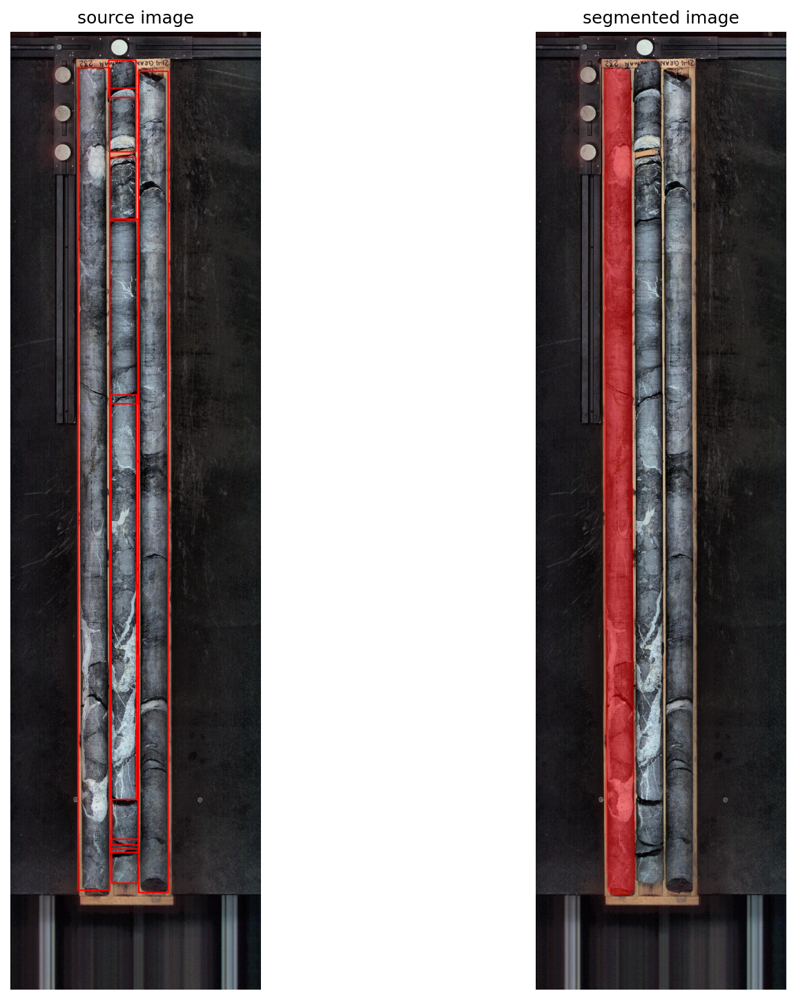

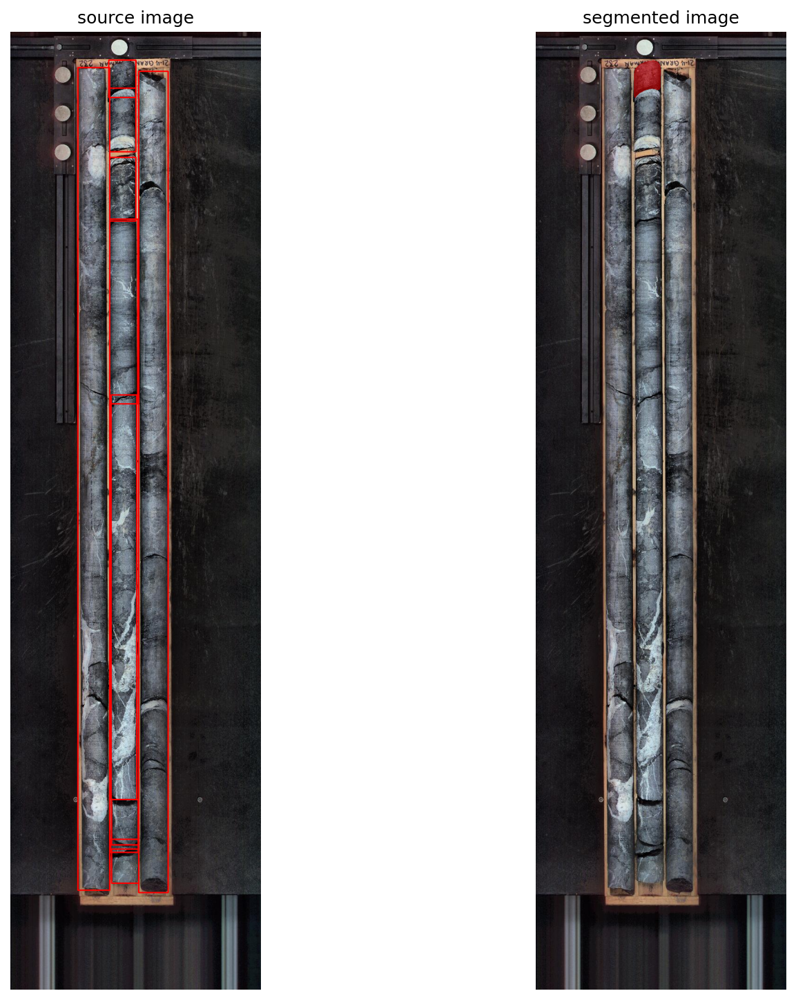

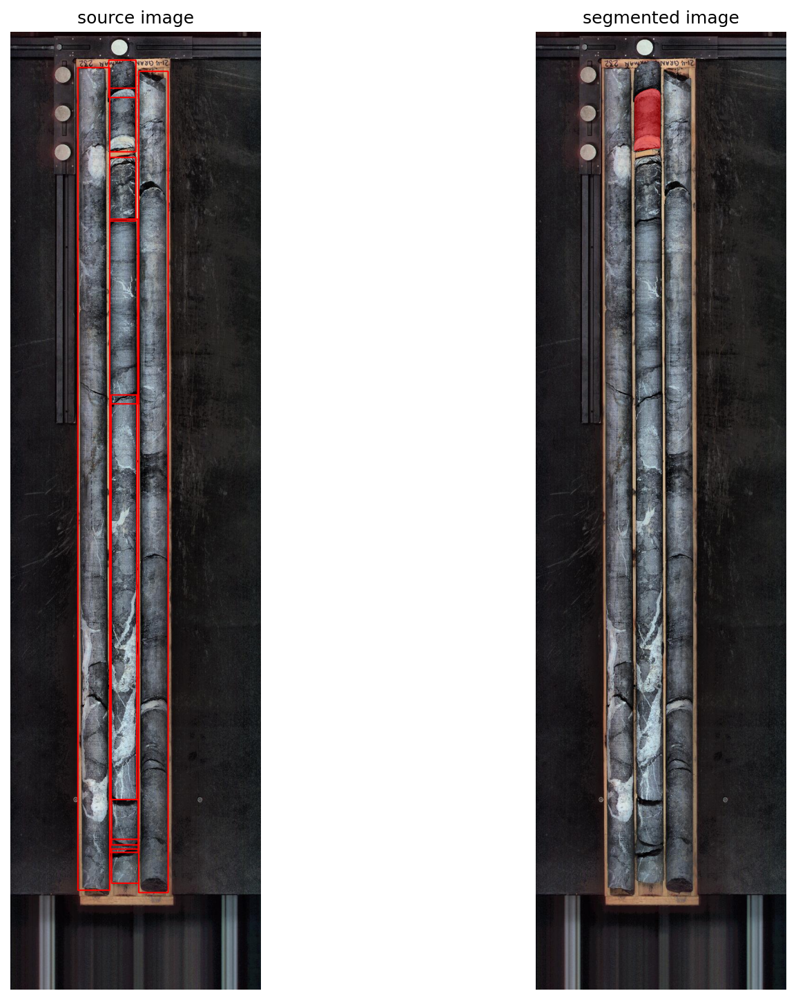

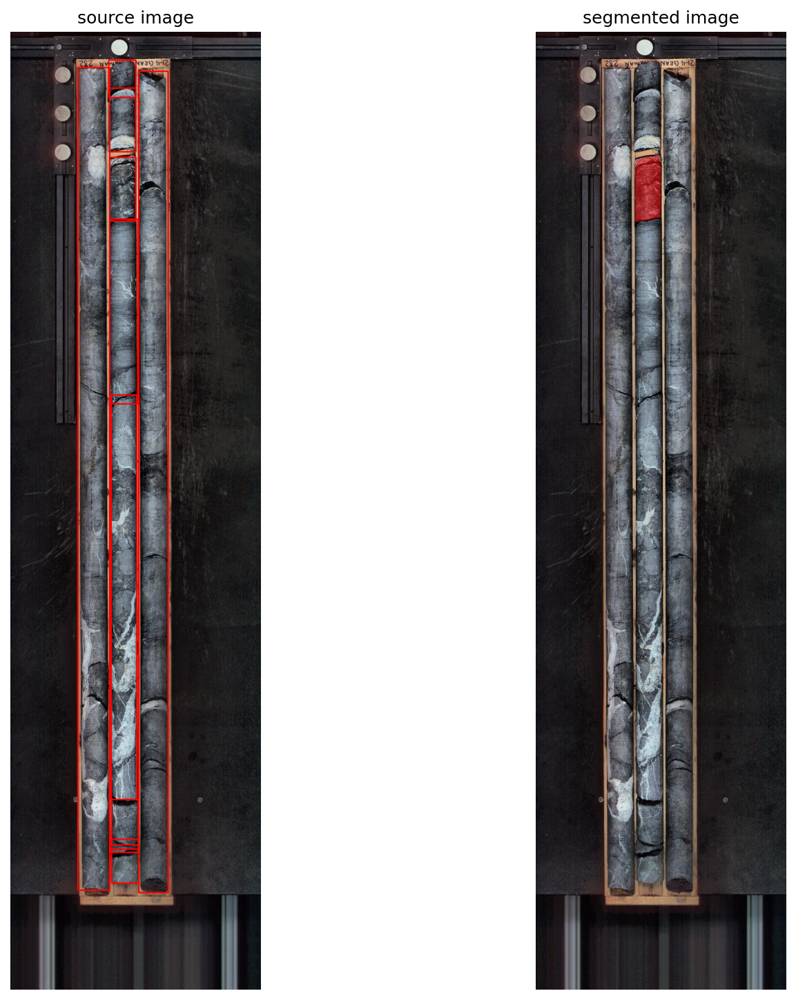

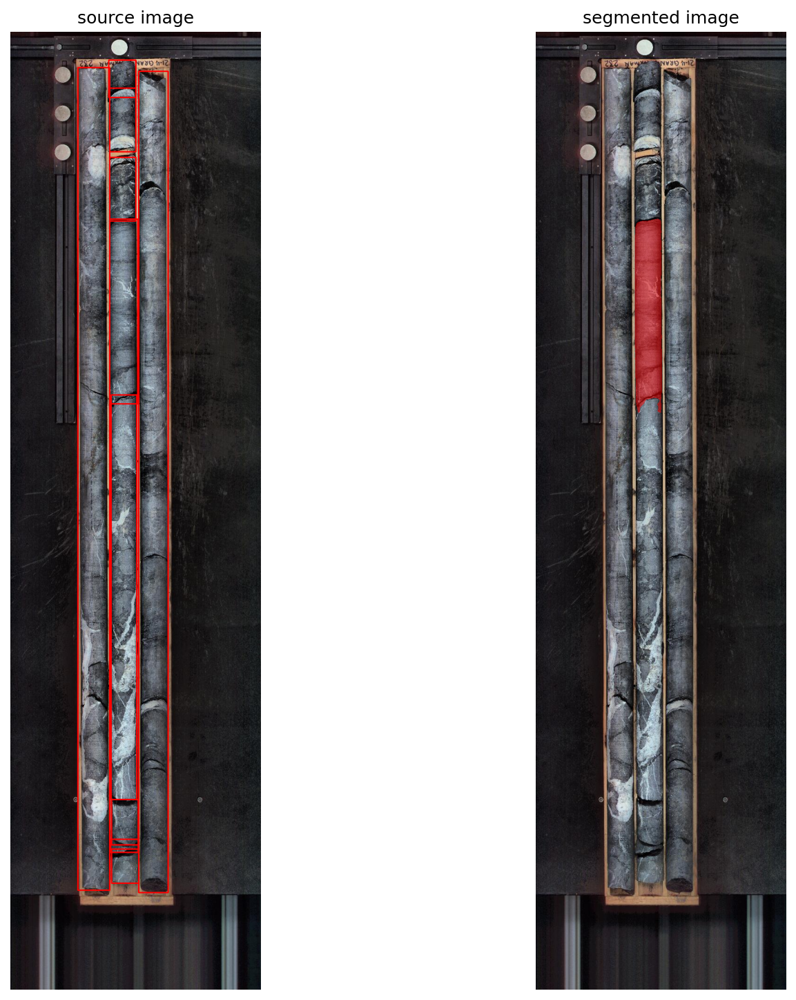

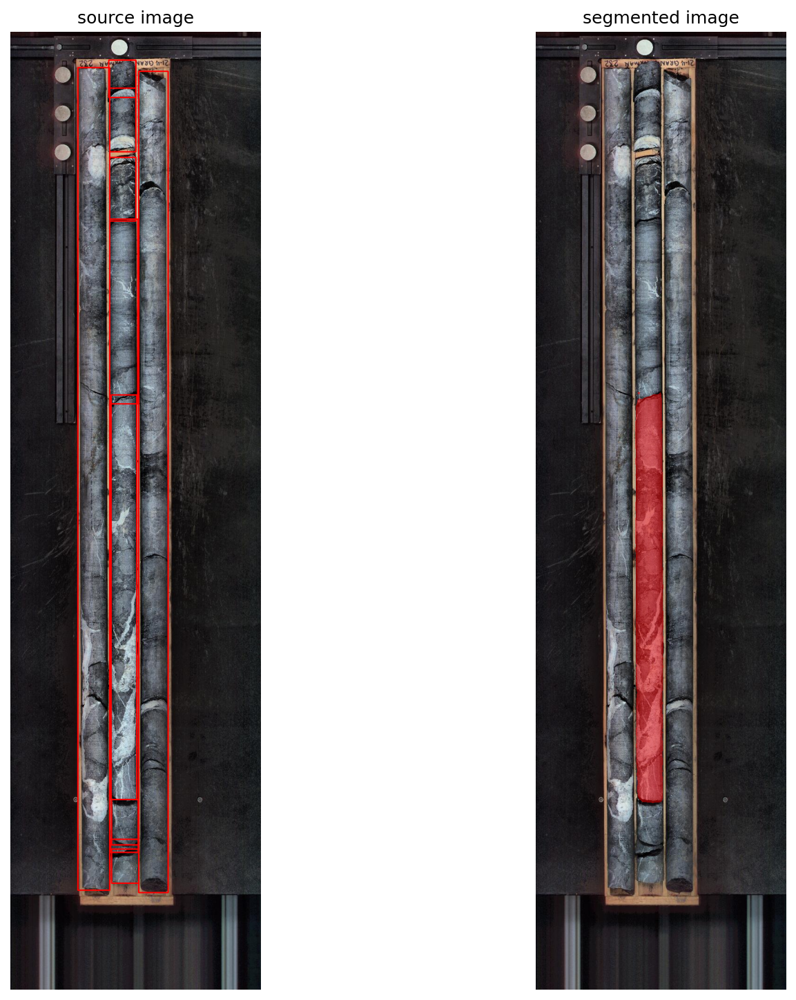

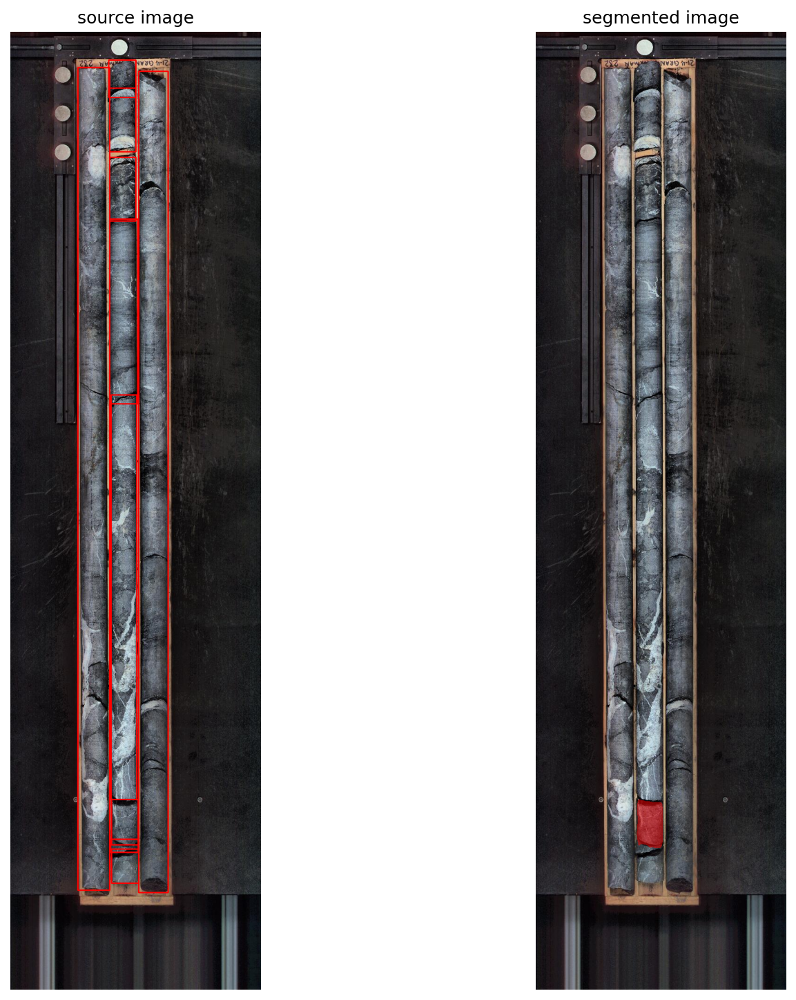

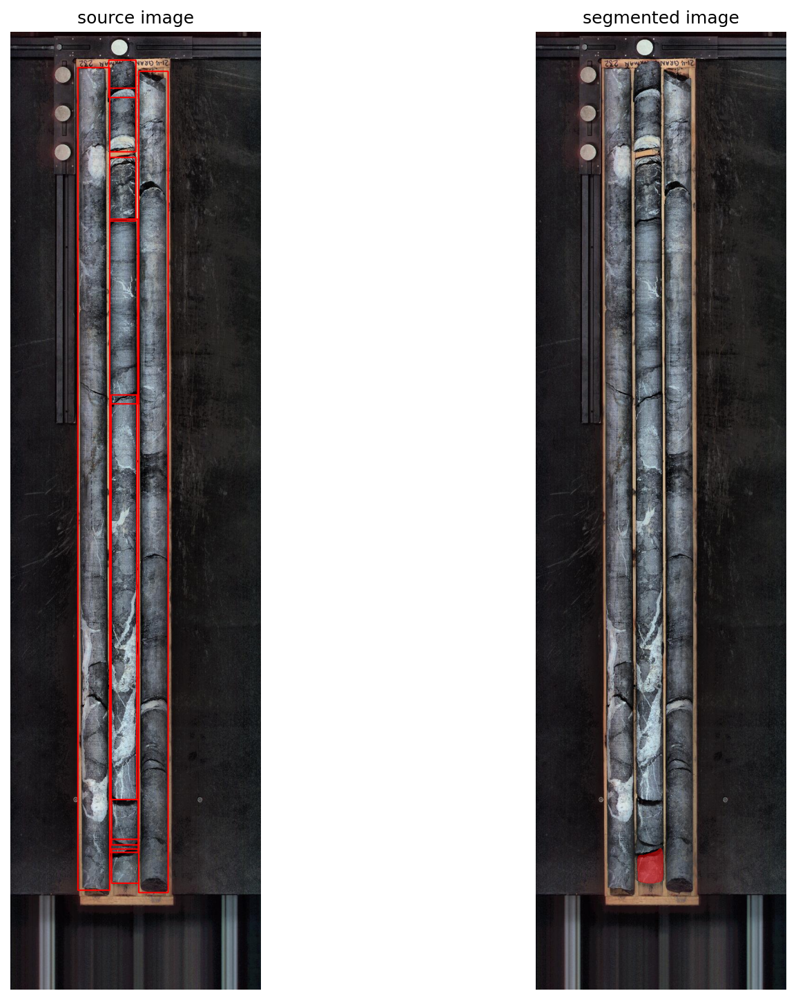

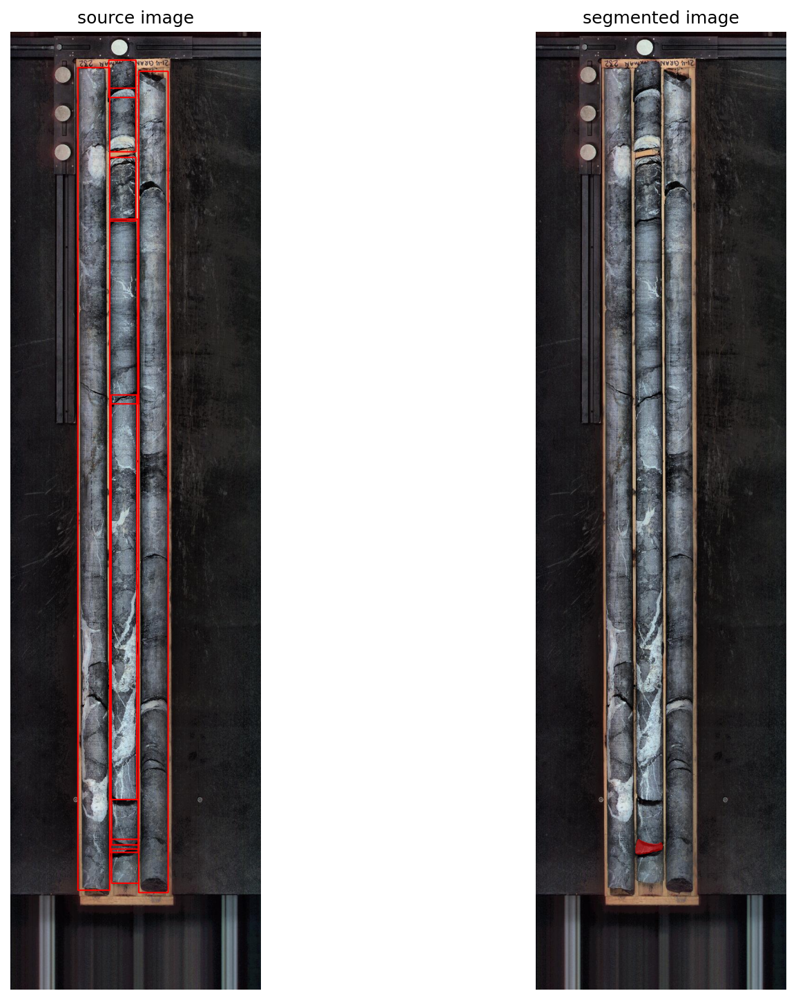

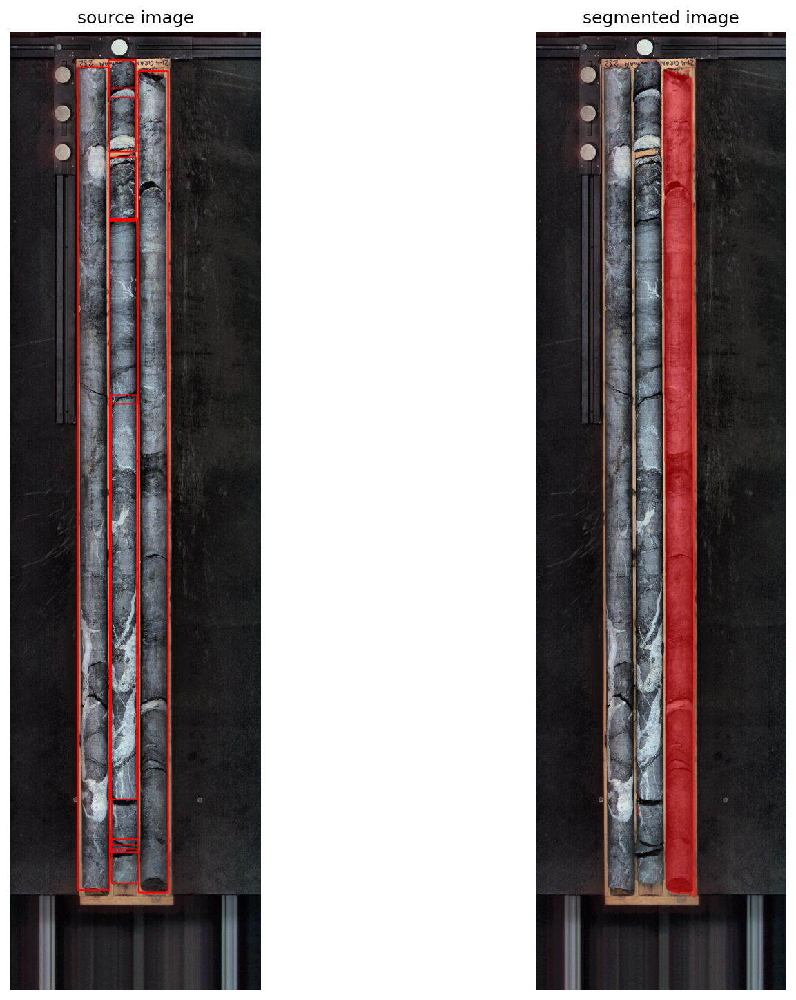

In [ ]:
EXAMPLE_IMAGE_NAME = random.choice(IMAGES)
EXAMPLE_IMAGE_PATH = os.path.join(dataset.location, DATA_SET_SUBDIRECTORY, EXAMPLE_IMAGE_NAME)

# load dataset annotations
annotations = COCOJsonUtility.get_annotations_by_image_path(coco_data=coco_data, image_path=EXAMPLE_IMAGE_NAME)
ground_truth = COCOJsonUtility.annotations2detections(annotations=annotations)

# small hack - coco numerate classes from 1, model from 0 + we drop first redundant class from coco json
# ground_truth.class_id = ground_truth.class_id - 1

# load image
image_bgr = cv2.imread(EXAMPLE_IMAGE_PATH)
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

# initiate annotator
box_annotator = sv.BoxAnnotator(color=sv.Color.RED, color_lookup=sv.ColorLookup.INDEX)
mask_annotator = sv.MaskAnnotator(color=sv.Color.RED, color_lookup=sv.ColorLookup.INDEX)

# annotate ground truth
annotated_frame_ground_truth = box_annotator.annotate(scene=image_bgr.copy(), detections=ground_truth)

# run SAM inference
mask_predictor.set_image(image_rgb)
# save the individual mask
sam_mask = []
for i in range(len(ground_truth)):
  masks, scores, logits = mask_predictor.predict(
      box=ground_truth.xyxy[i],
      multimask_output=True
  )
  sam_mask.append(masks)

  detections = sv.Detections(
      xyxy=sv.mask_to_xyxy(masks=masks),
      mask=masks
  )
  detections = detections[detections.area == np.max(detections.area)]

  annotated_image = mask_annotator.annotate(scene=image_bgr.copy(), detections=detections)

  sv.plot_images_grid(
      images=[annotated_frame_ground_truth, annotated_image],
      grid_size=(1, 2),
      titles=['source image', 'segmented image']
  )

In [ ]:
result_mask = [mask*1 for mask in sam_mask]

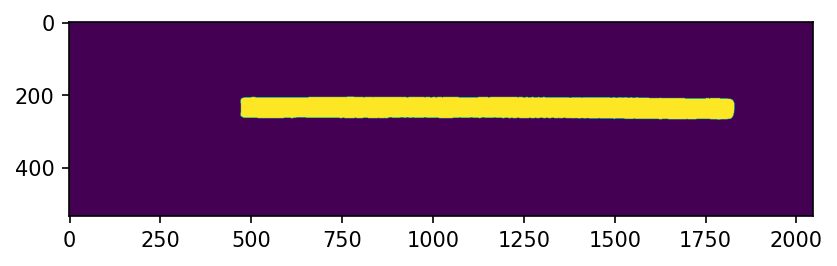

In [ ]:
plt.imshow(np.swapaxes(result_mask[1][1], 0, 1))

In [2]:
mymask = []
for i in range(len(result_mask)):
  mask = np.sum(result_mask[i], axis = 0)
  mask[mask > 1] =1
  mymask.append(mask)
  plt.figure(figsize = (2,2))
  plt.imshow(mask, interpolation='nearest')

NameError: name 'result_mask' is not defined

In [ ]:
temp_image = image_rgb.copy()

0


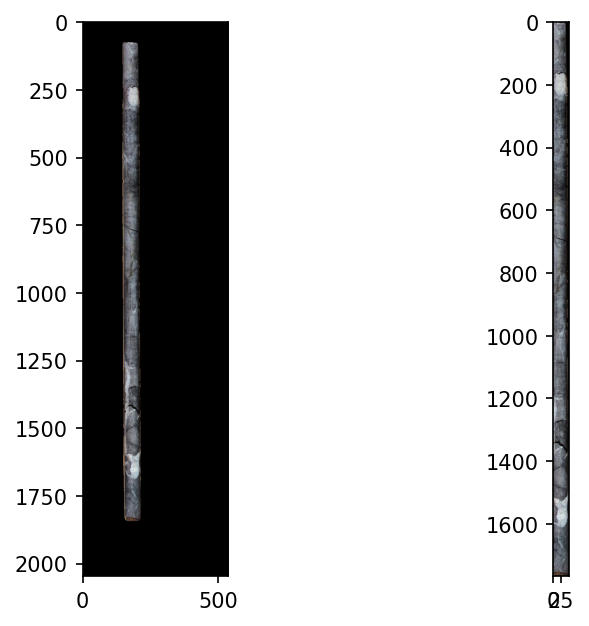

1


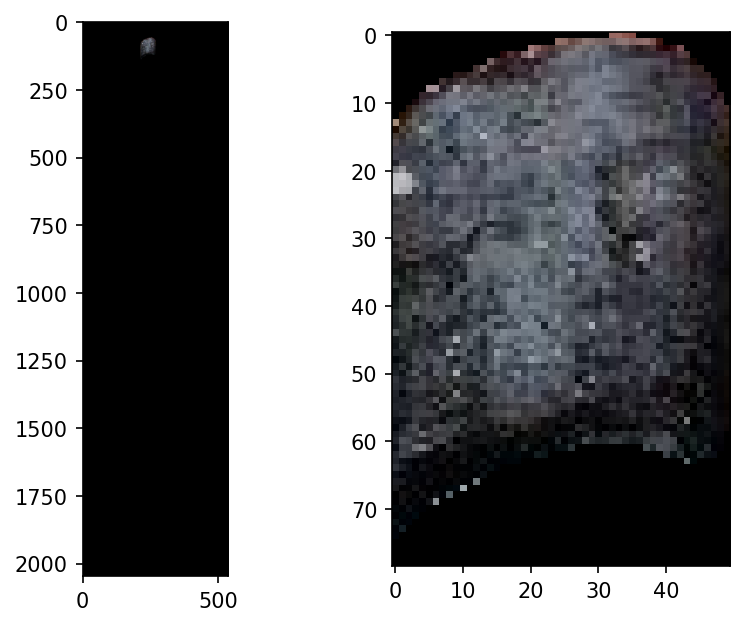

2


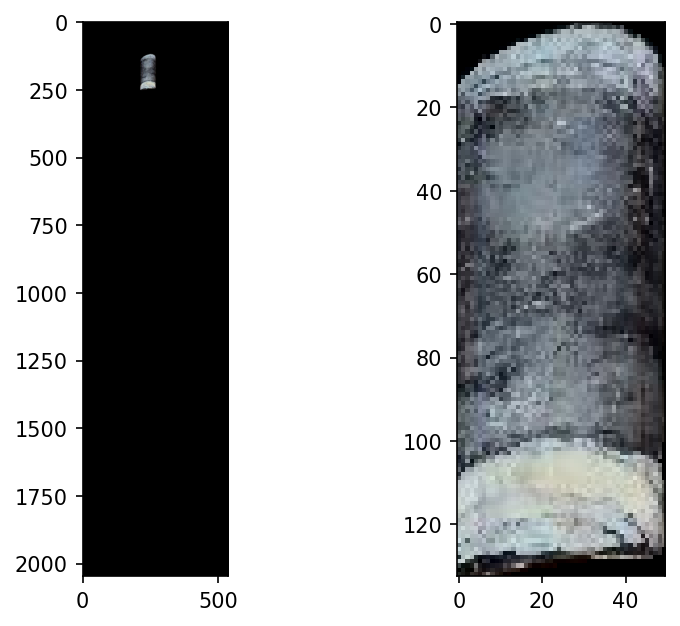

3


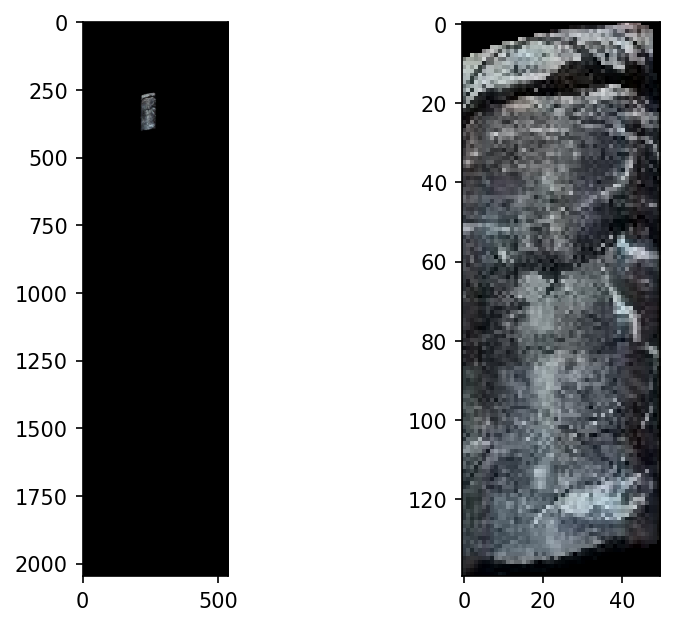

4


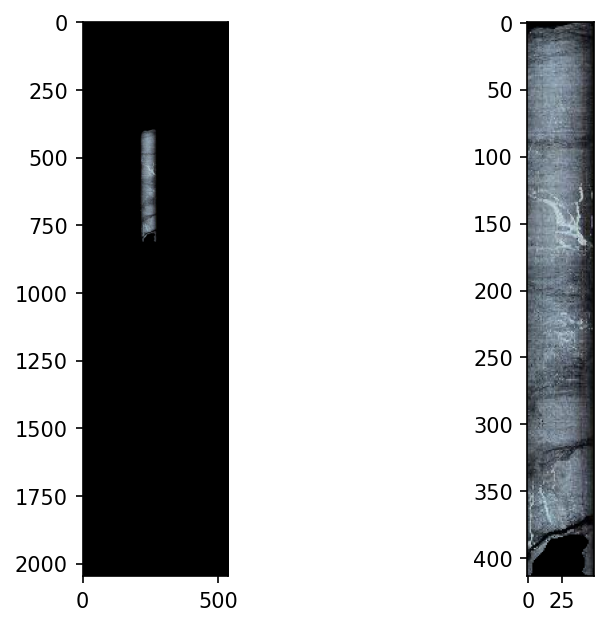

5


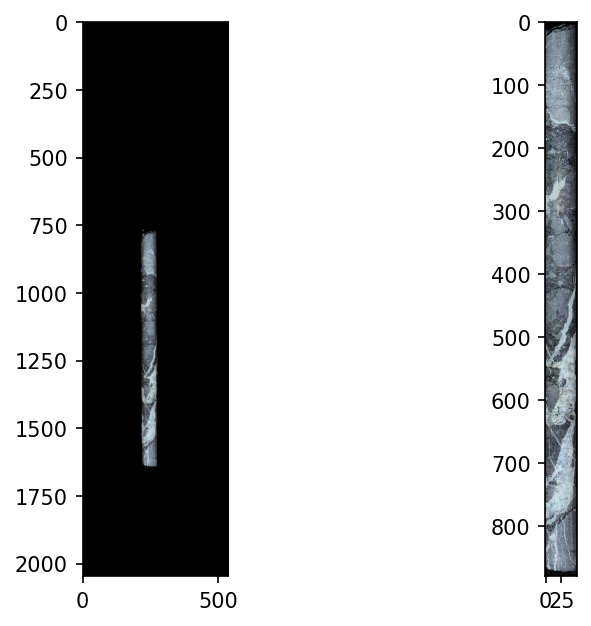

6


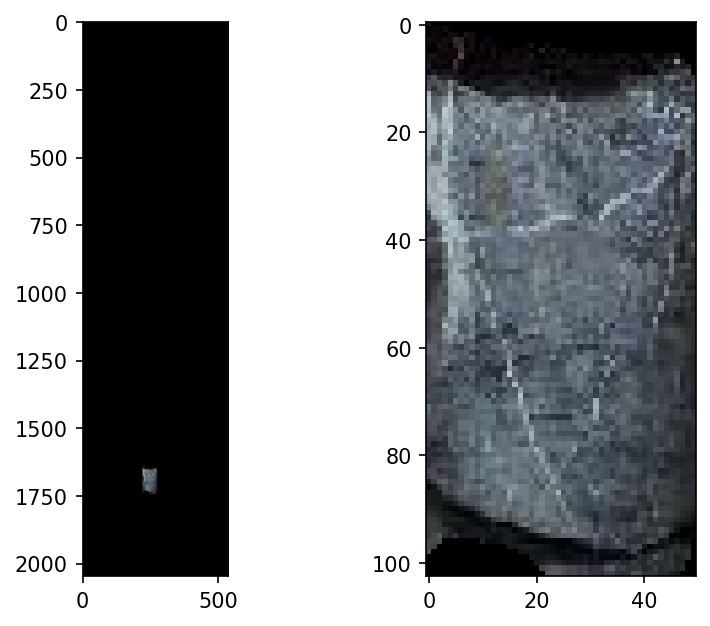

7


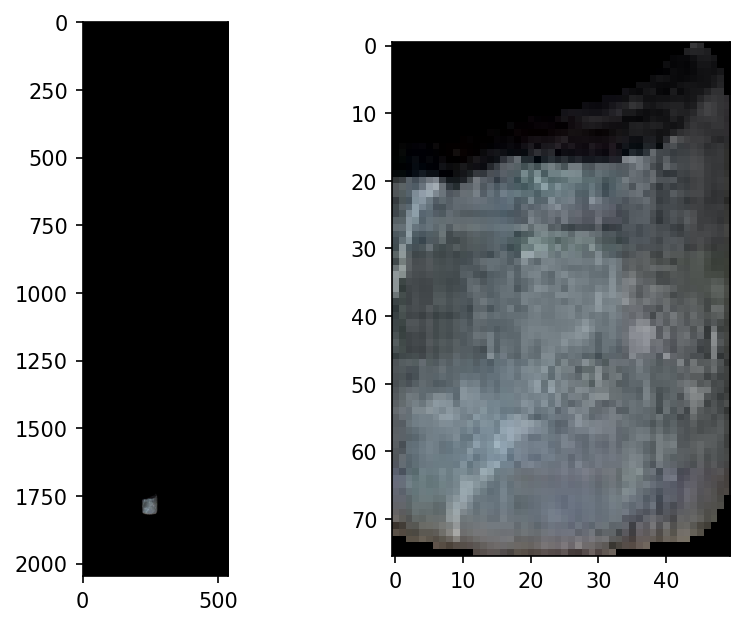

8


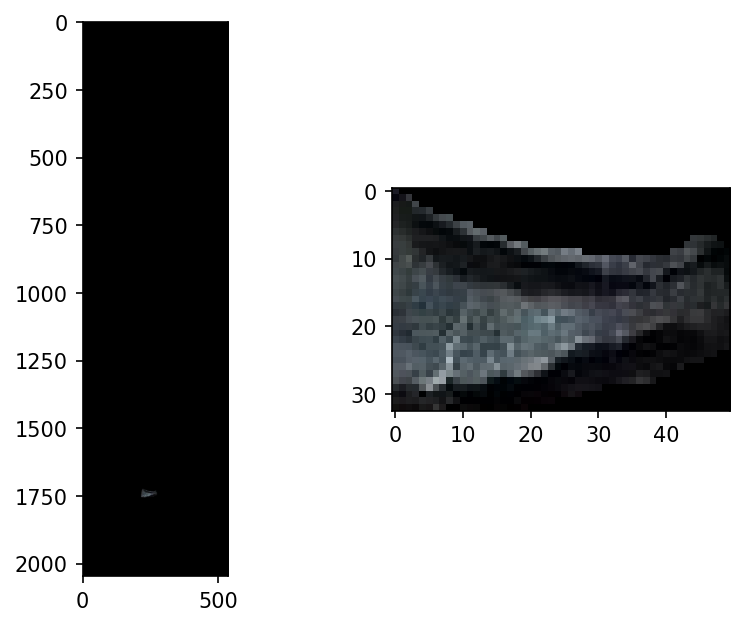

9


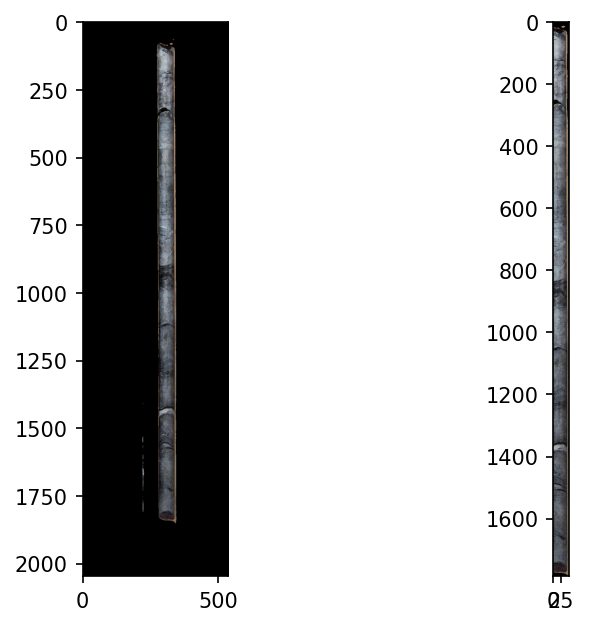

In [ ]:
image_dic = {}
for i, new_mask in enumerate(mymask):
  print(i)
  temp_image_masked = cv2.bitwise_and(temp_image, temp_image, mask = new_mask.astype('uint8'))
  indices = np.where(new_mask == 1)
  min_x = np.min(indices[1])
  max_x = np.max(indices[1])
  if (max_x - min_x) > 50:
    min_x = max_x - 50
  min_y = np.min(indices[0])
  max_y = np.max(indices[0])
  new_image = temp_image_masked[min_y:max_y, min_x:max_x]
  # store the images in a dictionary to sort them based on their minimum value of their x coordinate
  image_dic[min_x] = new_image
  plt.figure()
  plt.subplot(1,2,1)
  plt.imshow(temp_image_masked)
  plt.subplot(1,2,2)
  plt.imshow(new_image)
  plt.show()

In [ ]:
# Sort the extracted images based on their minimum x values
sorted_image_dic = dict(sorted(image_dic.items(), key = lambda x: x[0]))
image_tuple = tuple([value for value in sorted_image_dic.values()])

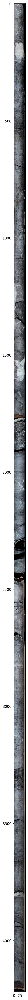

In [ ]:
plt.figure(figsize = (10,50))
plt.imshow(np.vstack(image_tuple))

In [ ]:
final_image = np.vstack(image_tuple)

In [ ]:
final_image.shape

(4218, 50, 3)

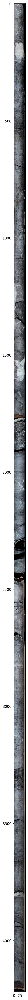

In [ ]:
# Sort the extracted images based on their minimum x values
sorted_image_dic = dict(sorted(image_dic.items(), key = lambda x: x[0]))
image_tuple = tuple([value for value in sorted_image_dic.values()])
image_tuple[-1][:,-1:-5] = 0
final_image = np.vstack(image_tuple)
plt.figure(figsize = (10,50))
plt.imshow(final_image)

In [33]:
import numpy as np
import spectral as sp
from spectral import get_rgb
import spectral.io.envi as envi

In [34]:
# attempting for SWIR
raw   = envi.open("/content/drive/MyDrive/Colab Notebooks/Data/20230703/SWIR/21.4.GRANGEGORMAN_221_943m10_947m35_2023-07-03_14-49-12/capture/21.4.GRANGEGORMAN_221_943m10_947m35_2023-07-03_14-49-12.hdr")
dark  = envi.open("/content/drive/MyDrive/Colab Notebooks/Data/20230703/SWIR/21.4.GRANGEGORMAN_221_943m10_947m35_2023-07-03_14-49-12/capture/DARKREF_21.4.GRANGEGORMAN_221_943m10_947m35_2023-07-03_14-49-12.hdr")
white = envi.open("/content/drive/MyDrive/Colab Notebooks/Data/20230703/SWIR/21.4.GRANGEGORMAN_221_943m10_947m35_2023-07-03_14-49-12/capture/WHITEREF_21.4.GRANGEGORMAN_221_943m10_947m35_2023-07-03_14-49-12.hdr")

Parameters with non-lowercase names encountered and converted to lowercase. To retain source file parameter name capitalization, set spectral.settings.envi_support_nonlowercase_params to True.


In [35]:
# normalize the data
raw = np.array(raw.load())
dark = np.array(dark.load())
white = np.array(white.load())

In [37]:
corrected_data = np.divide(np.subtract(raw, np.mean(dark, axis = 0)), np.subtract(np.mean(white, axis = 0), np.mean(dark, axis = 0)))

invalid value encountered in divide


In [41]:
(corrected_data == np.nan).sum()

0

In [43]:
corrected_data[corrected_data < 0] = 0

In [44]:
# plotting the corrected image
test_image = get_rgb(corrected_data)

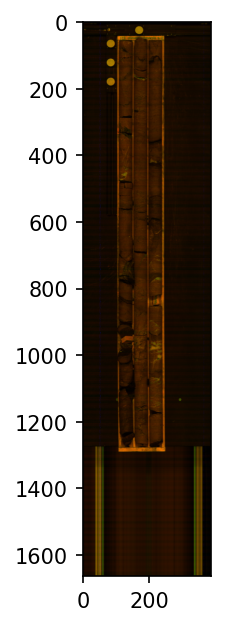

In [45]:
plt.imshow(test_image)

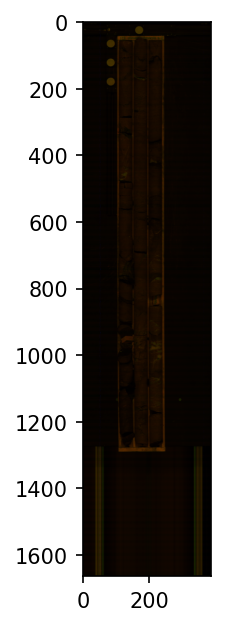

In [72]:
plt.imshow(((test_image*100).astype("uint8")))

In [68]:
# load image
# image_bgr = cv2.imread(EXAMPLE_IMAGE_PATH)
image_rgb = (test_image.copy()*100).astype('uint8')
# image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)



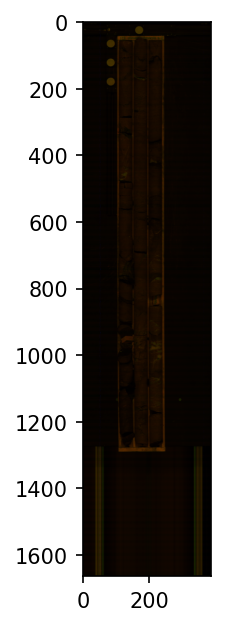

In [55]:
plt.imshow(image_rgb)

In [75]:
# save the image
sp.save_rgb('test_image.jpg', corrected_data)

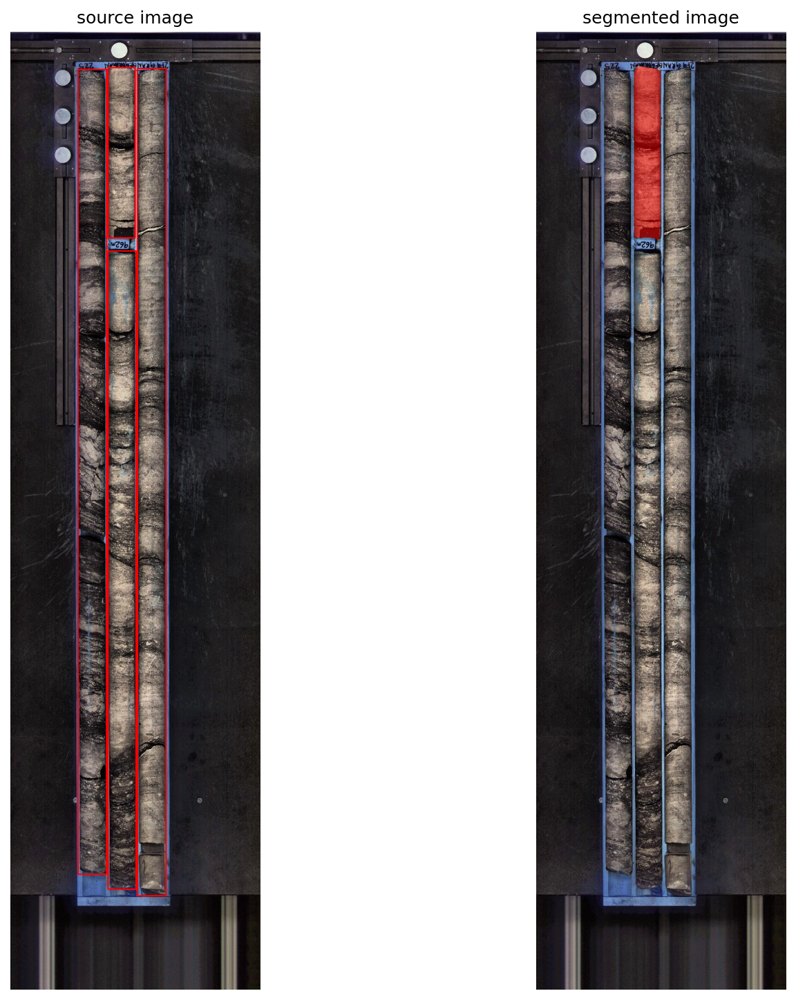

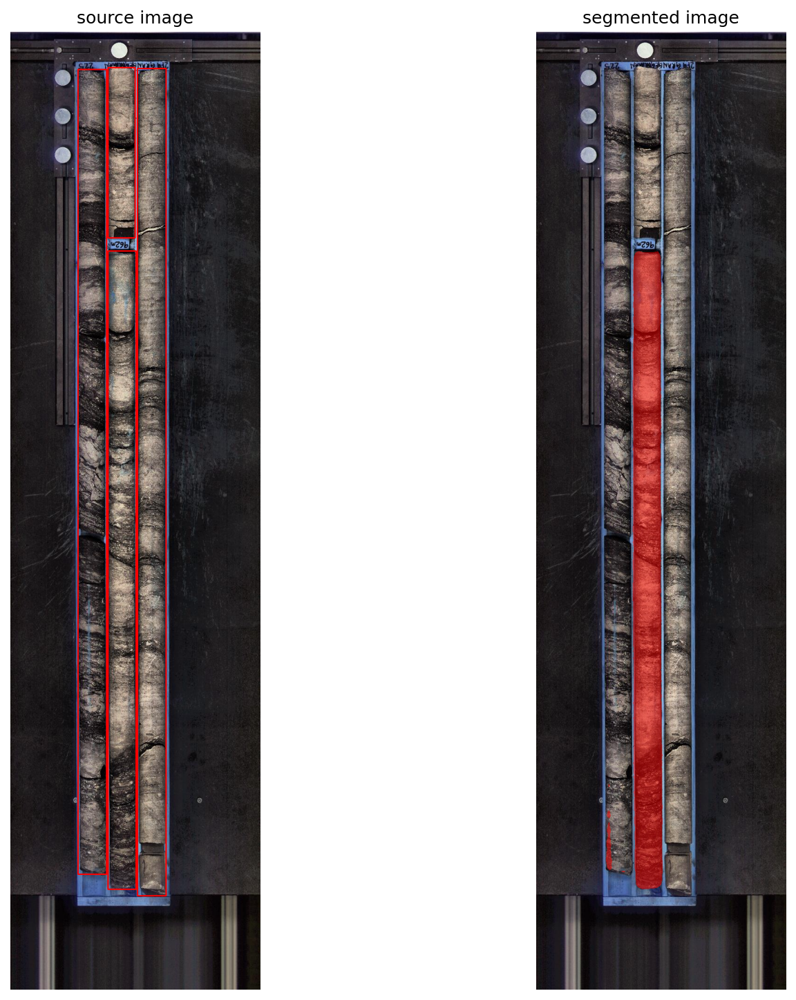

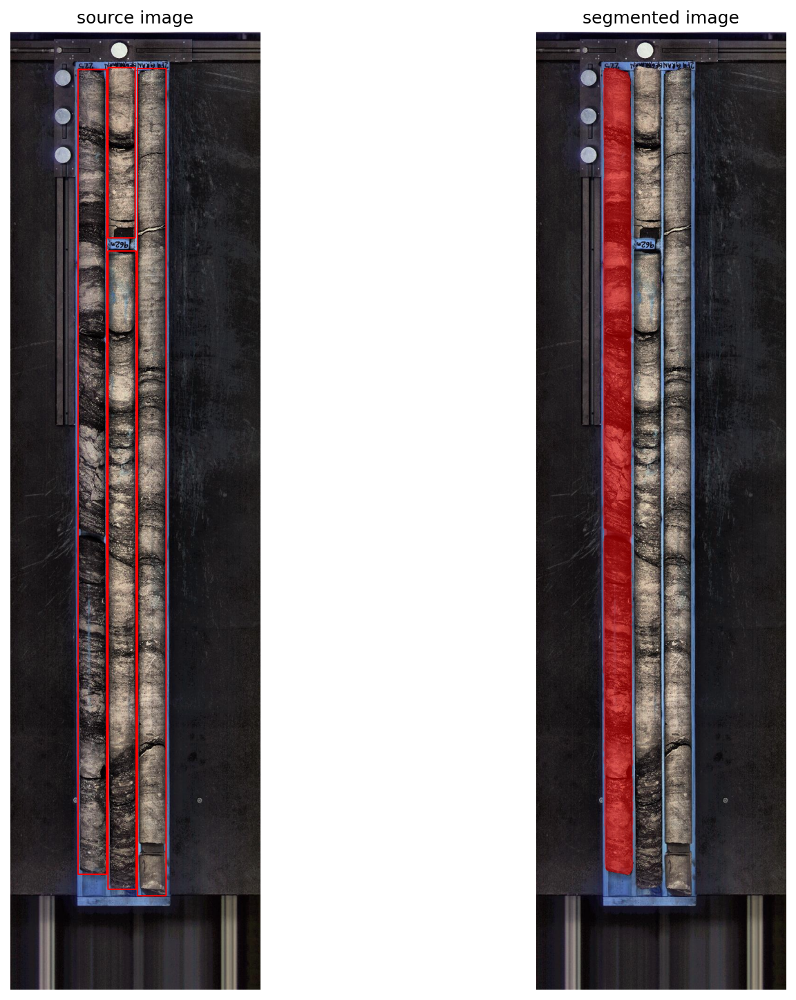

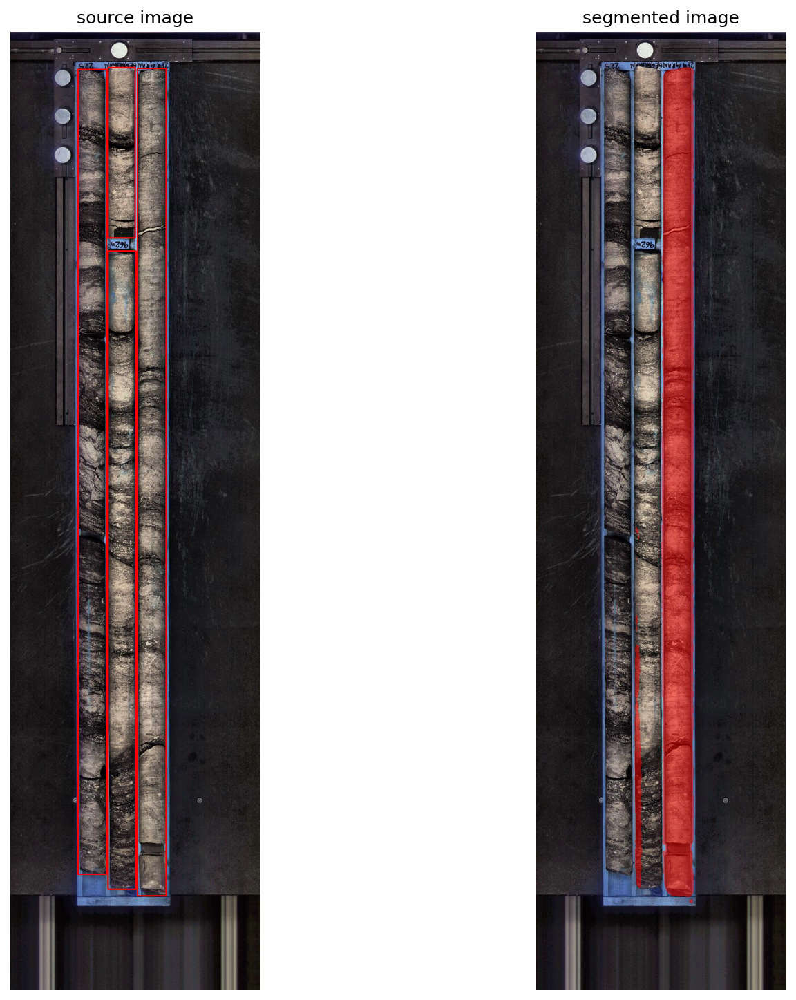

In [88]:
EXAMPLE_IMAGE_NAME = random.choice(IMAGES)
EXAMPLE_IMAGE_PATH = os.path.join(dataset.location, DATA_SET_SUBDIRECTORY, EXAMPLE_IMAGE_NAME)
# EXAMPLE_IMAGE_NAME = "test_image.jpg"
# EXAMPLE_IMAGE_PATH = "/content/test_image.jpg"

# load dataset annotations
annotations = COCOJsonUtility.get_annotations_by_image_path(coco_data=coco_data, image_path=EXAMPLE_IMAGE_NAME)
ground_truth = COCOJsonUtility.annotations2detections(annotations=annotations)

# load image
image_bgr = cv2.imread(EXAMPLE_IMAGE_PATH)
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

# initiate annotator
box_annotator = sv.BoxAnnotator(color=sv.Color.RED, color_lookup=sv.ColorLookup.INDEX)
mask_annotator = sv.MaskAnnotator(color=sv.Color.RED, color_lookup=sv.ColorLookup.INDEX)

# annotate ground truth
annotated_frame_ground_truth = box_annotator.annotate(scene=image_rgb.copy(), detections=ground_truth)

# run SAM inference
mask_predictor.set_image(image_rgb)
# save the individual mask
sam_mask = []
for i in range(len(ground_truth)):
  masks, scores, logits = mask_predictor.predict(
      box=ground_truth.xyxy[i],
      multimask_output=True
  )
  sam_mask.append(masks)

  detections = sv.Detections(
      xyxy=sv.mask_to_xyxy(masks=masks),
      mask=masks
  )
  detections = detections[detections.area == np.max(detections.area)]

  annotated_image = mask_annotator.annotate(scene=image_rgb.copy(), detections=detections)

  sv.plot_images_grid(
      images=[annotated_frame_ground_truth, annotated_image],
      grid_size=(1, 2),
      titles=['source image', 'segmented image']
  )

In [83]:
annotations = COCOJsonUtility.get_annotations_by_image_path(coco_data=coco_data, image_path=EXAMPLE_IMAGE_NAME)


In [89]:
# EXAMPLE_IMAGE_NAME = random.choice(IMAGES)
# EXAMPLE_IMAGE_PATH = os.path.join(dataset.location, DATA_SET_SUBDIRECTORY, EXAMPLE_IMAGE_NAME)

dataset.location

'/content/HSI-7'

In [90]:
DATA_SET_SUBDIRECTORY

'test'

In [91]:
EXAMPLE_IMAGE_NAME

'21-4-GRANGEGORMAN_225_960m30_964m60_2023-07-03_14-57-24_png.rf.300ffd5329411a650b4f448879ed3b2c.jpg'

In [92]:
IMAGES

['21-4-GRANGEGORMAN_232_993m45_995m10_2023-07-03_15-13-39_png.rf.d0863f7fb1ed4e59928ab76303c6531a.jpg',
 '21-4-GRANGEGORMAN_223_951m60_955m95_2023-07-03_14-52-52_png.rf.930a995edfd0b5af8efadcc18cd6b6b9.jpg',
 '21-4-GRANGEGORMAN_225_960m30_964m60_2023-07-03_14-57-24_png.rf.300ffd5329411a650b4f448879ed3b2c.jpg']